# Домашнее задание 
# Математика — Домашнее задание 11
# А.&#8201;Д. Егоров

In [1]:
import numpy as np 
from scipy import optimize as opt 
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Tuple

plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-light.mplstyle')
%matplotlib inline
# sns.set_palette(palette="Reds")

## Задание

По аналогии с реализацией GD и SGD реализуйте метод инерции(Momentum), RMSprop и Adam.

Для произвольной задачи (можно сгенерировать синтетически матрицу X и вектор y) сравните результаты работы трех методов оптимизации.

Проведите эксперименты с этими методами для задач разных размерностей, сравните оценки сходимости и сделайте выводы по эмпирическим результатам о скорости и точности сходимости в зависимости от размерности и параметров моделей.

## Baseline из ноутбука с лекцией

### Изменения, внесенные в baseline: 
- введен параметр точности вычислений и сравнений `tol` (tolerance),
- добавлен критерий останова по норме градиента, 
- добавлен критерий останова по норме разности весов на последних двух итерациях,
- добавлен критерий останова по количеству эпох,
- добавлен критерий останова по количеству итераций,
- в функцию отрисовки добавлена возможность передечи названия метода.


Сгенерируем данные для тестов:

In [2]:
n, m = 500, 2

w_true = np.random.standard_normal(m)

X = np.random.uniform(-5, 5, (n, m))
X *= (np.arange(m) * 2 + 1)[np.newaxis, :]

y = X.dot(w_true) + np.random.normal(0, 1, (n))

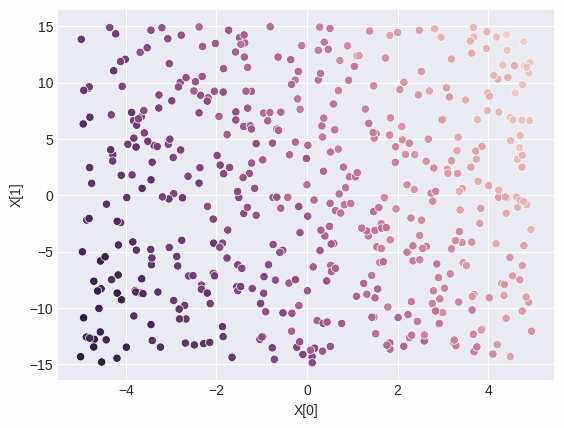

In [3]:
g = sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=y)
g.legend_.remove()
g.set(xlabel="X[0]", ylabel="X[1]")
plt.show()

### Функция для отрисовки

In [4]:
def plot_weight_levels(X, y, w_history: np.ndarray, method: str = ""):


    w1_vals = np.linspace(min(w_history[:, 0]) - 1, max(w_history[:, 0]) + 1, 100)
    w2_vals = np.linspace(min(w_history[:, 1]) - 1, max(w_history[:, 1]) + 1, 100)

    W1, W2 = np.meshgrid(w1_vals, w2_vals)
    J_vals = np.zeros_like(W1)

    for i in range(len(w1_vals)):
        for j in range(len(w2_vals)):
            w_tmp = np.array([W1[i, j], W2[i, j]])
            J_vals[i, j] = np.mean((X.dot(w_tmp) - y) ** 2) / 2

    plt.figure(figsize=(7, 7))
    plt.rcParams["figure.dpi"] = 500
    plt.contour(W1, W2, J_vals, levels=30, cmap="viridis")

    plt.scatter(
        w_history[-1][0],
        w_history[-1][1],
        marker="*",
        s=200,
        color="black",
        label="Final Point",
    )

    plt.plot(
        w_history[:, 0],
        w_history[:, 1],
        marker="o",
        linestyle="-",
        color="red",
        label=f"{method} Trajectory",
    )

    # plt.xlim(min(w_history[:, 0]) - 1,  max(w_history[:, 0]) + 1)
    # plt.ylim(min(w_history[:, 1]) - 1,  max(w_history[:, 1]) + 1)
    # plt.autoscale(False)


    plt.title(f"Weight Levels and {method} Trajectory")
    plt.xlabel("Weight 1")
    plt.ylabel("Weight 2")
    plt.legend()
    plt.show()

## Блок с реализацией методов


### Градиентный спуск

In [5]:
def GD(
    X: np.ndarray,
    y: np.ndarray,
    gamma: float,
    x0=None,
    tol=1e-6,
    maxiter=None,
    breakcond=True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, int]:
    """Function for optimization of weights with Gradient Descent method

    Args:
        X (np.ndarray) : Feature matrix.
        y (np.ndarray) : Target vector.
        gamma (float) : Step lenght.
        x0 (_type_, optional) : Initial values (guess) for weights. Defaults to None.
        tol : Tolerance. Default = 1e-6.
        maxiter : Maximum of iterations.
        breakcond (bool) : Condition: if True then method will use difference between weights on k-th and (k-1)-th steps as a criteria for break.

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, int, int] : array of weights, array with history of weights points, array with history of errors, number of iteration
    """
    n, m = X.shape[0], X.shape[1]

    if x0 is None:  # init anti-gradient
        x0 = np.random.standard_normal(m)
    else:
        x0 = np.array(x0)
        if x0.shape[0] != m:
            raise Exception("Wrong size of x0")

    x_cur = x0.copy()
    x_history = [x_cur.copy()]
    err_history = []

    nit = 0  # number of iterations

    breaker = True
    while breaker:

        y_pred = X.dot(x_cur)  # RHS for current weights
        err = y_pred - y  # error
        err_history.append(err.mean())

        grad = 2 * X.T.dot(err) / n  # gradient

        # Break condition ||grad|| < tol
        # if np.linalg.norm(grad) < tol:
        #     break

        x_cur -= gamma * grad  # step to anti-gradient's direction
        x_history.append(x_cur.copy())
        
        nit += 1
        if maxiter is not None:
            if nit > maxiter:
                breaker = False
                break

        # Break condition: 
        # Difference between weights on k-th and (k-1)-th steps
        # is less then tolerance
        if breakcond:
            if np.linalg.norm(x_cur - x_history[-2]) < tol:
                breaker = False
                break

    return x_cur, np.array(x_history), np.array(err_history), nit

iterations: 73
optimum: [-2.21346564 -0.23515197]


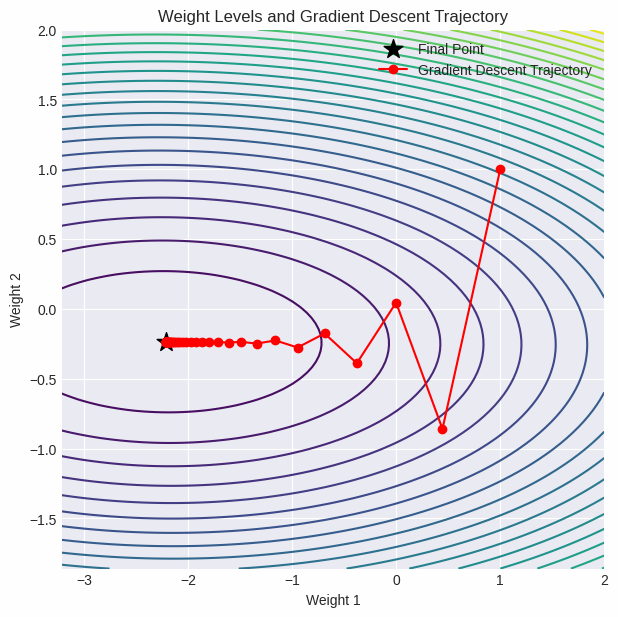

In [6]:
x, x_history, _, nit = GD(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    gamma=1e-2,
    tol=1e-6,
    maxiter=10000,
)
print(f"iterations: {nit}")
print(f"optimum: {x}")
plot_weight_levels(X, y, x_history, method="Gradient Descent")

In [7]:
def generate_batch(X, y, batch_size):
    """Генератор для получения батча из данных"""
    for i in range(0, len(X), batch_size):
        yield X[i : i + batch_size], y[i : i + batch_size]

### Стохастический градиентный спуск

In [8]:
def SGD(
    X: np.ndarray,
    y: np.ndarray,
    gamma: float,
    batch_size: int = 10,
    x0=None,
    tol=1e-6,
    maxiter=None,
    maxepoch=None,
    breakcond=True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, int, int]:
    """Function for optimization of weights with Stochastic Gradient Descent (SGD) method

    Args:
        X (np.ndarray) : Feature matrix.
        y (np.ndarray) : Target vector.
        gamma (float) : Step lenght.
        batch_size (int) : batch size. Default = 10.
        x0 (_type_, optional) : Initial values (guess) for weights. Defaults to None.
        tol : Tolerance. Default = 1e-6.
        maxiter : Maximum of iterations.
        maxepoch : Maximum of epochs.
        breakcond (bool) : Condition: if True then method will use difference between weights on k-th and (k-1)-th steps as a criteria for break.

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, int, int] : array of weights, array with history of weights points, array with history of errors, number of iteration, number of epochs
    """
    n, m = X.shape[0], X.shape[1]

    if x0 is None:  # initial anti-gradient
        x0 = np.random.standard_normal(m)
    else:
        x0 = np.array(x0)
        if x0.shape[0] != m:
            raise Exception("Wrong size of x0")

    x_cur = x0.copy()
    x_history = [x_cur.copy()]
    err_history = []

    nit = 0  # number of itereations
    nep = 0  # number of epochs

    breaker = True
    while breaker:

        p = np.random.permutation(len(X))  # get random permutation
        batch_generator = generate_batch(
            X[p], y[p], batch_size
        )  # init batch generator
        
        for X_batch, y_batch in batch_generator:  # iterate through batchs

            y_pred = X_batch.dot(x_cur)  # RHS for current weights
            err = y_pred - y_batch  # error
            err_history.append(err.mean())

            grad = 2 * X_batch.T.dot(err) / n  # gradient

            # Break condition ||grad|| < tol
            # if np.linalg.norm(grad) < tol:
            #     breaker = False
            #     break

            x_cur -= gamma * grad
            x_history.append(x_cur.copy())

            nit += 1
            if maxiter is not None:
                if nit >= maxiter:
                    breaker = False
                    break

            # Break condition: 
            # Difference between weights on k-th and (k-1)-th steps
            # is less then tolerance
            if breakcond:
                if np.linalg.norm(x_cur - x_history[-2]) < tol:
                    breaker = False
                    break

        nep += 1
        if maxepoch is not None:
            if nep >= maxepoch:
                breaker = False
                break

    return x_cur, np.array(x_history), np.array(err_history), nit, nep


epochs: 1362
iterations: 13619
optimum: [-2.21030791 -0.23514355]


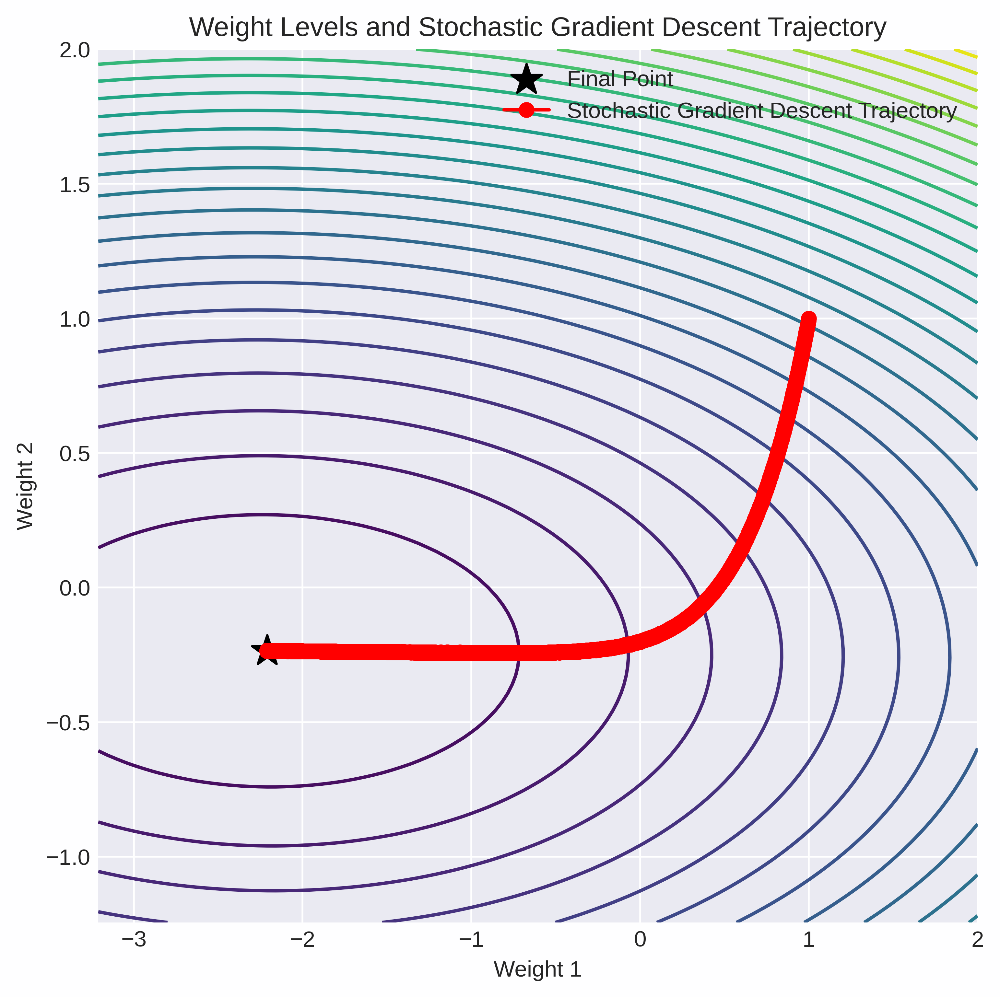

In [9]:
x, x_history, _, nit, nep = SGD(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    batch_size=50,
    gamma=3e-4,
    tol=1e-6,
    maxepoch=10000
)
print(f"epochs: {nep}")
print(f"iterations: {nit}")
print(f"optimum: {x}")
plot_weight_levels(X, y, x_history, method="Stochastic Gradient Descent")

### Метод инерции

In [10]:
def momentum_GD(
    X: np.ndarray,
    y: np.ndarray,
    gamma: float,
    x0=None,
    beta=0.9,  # take 10% momentum from previous step
    tol=1e-6,
    maxiter=None,
    breakcond=True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, int]:
    """Function for optimization of weights with Momentum method

    Args:
        X (np.ndarray) : Feature matrix.
        y (np.ndarray) : Target vector.
        gamma (float) : Step lenght.
        x0 (_type_, optional) : Initial values (guess) for weights. Defaults to None.
        beta : Volume of momentum taken from current step. Default = 0.9.
        tol : Tolerance. Default = 1e-6.
        maxiter : Maximum of iterations.
        breakcond (bool) : Condition: if True then method will use difference between weights on k-th and (k-1)-th steps as a criteria for break.

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, int, int] : array of weights, array with history of weights points, array with history of errors, number of iteration.
    """
    n, m = X.shape[0], X.shape[1]

    if x0 is None:  # initial anti-gradient
        x0 = np.random.standard_normal(m)
    else:
        x0 = np.array(x0)
        if x0.shape[0] != m:
            raise Exception("Wrong size of x0")

    x_cur = x0.copy()
    x_history = [x_cur.copy()]
    err_history = []

    nit = 0  # number of iterations
    h_cur = np.zeros(m)  # initialize step for momentum

    breaker = True
    while breaker:

        y_pred = X.dot(x_cur)  # RHS for current weights
        err = y_pred - y  # error
        err_history.append(err.mean())

        grad = 2 * X.T.dot(err) / n  # gradient
        
        # Break condition ||grad|| < tol
        # if np.linalg.norm(grad) < tol:
        #     break

        # # add momentum
        h_cur = gamma * grad + beta * h_cur

        # calculate new optimum
        x_cur -= h_cur
        x_history.append(x_cur.copy())

        nit += 1
        if maxiter is not None:
            if nit >= maxiter:
                breaker = False
                break

        # Break condition: 
        # Difference between weights on k-th and (k-1)-th steps
        # is less then tolerance
        if breakcond:
            if np.linalg.norm(x_cur - x_history[-2]) < tol:
                breaker = False
                break

    return x_cur, np.array(x_history), np.array(err_history), nit


iterations: 30
optimum: [-2.21347167 -0.23515165]


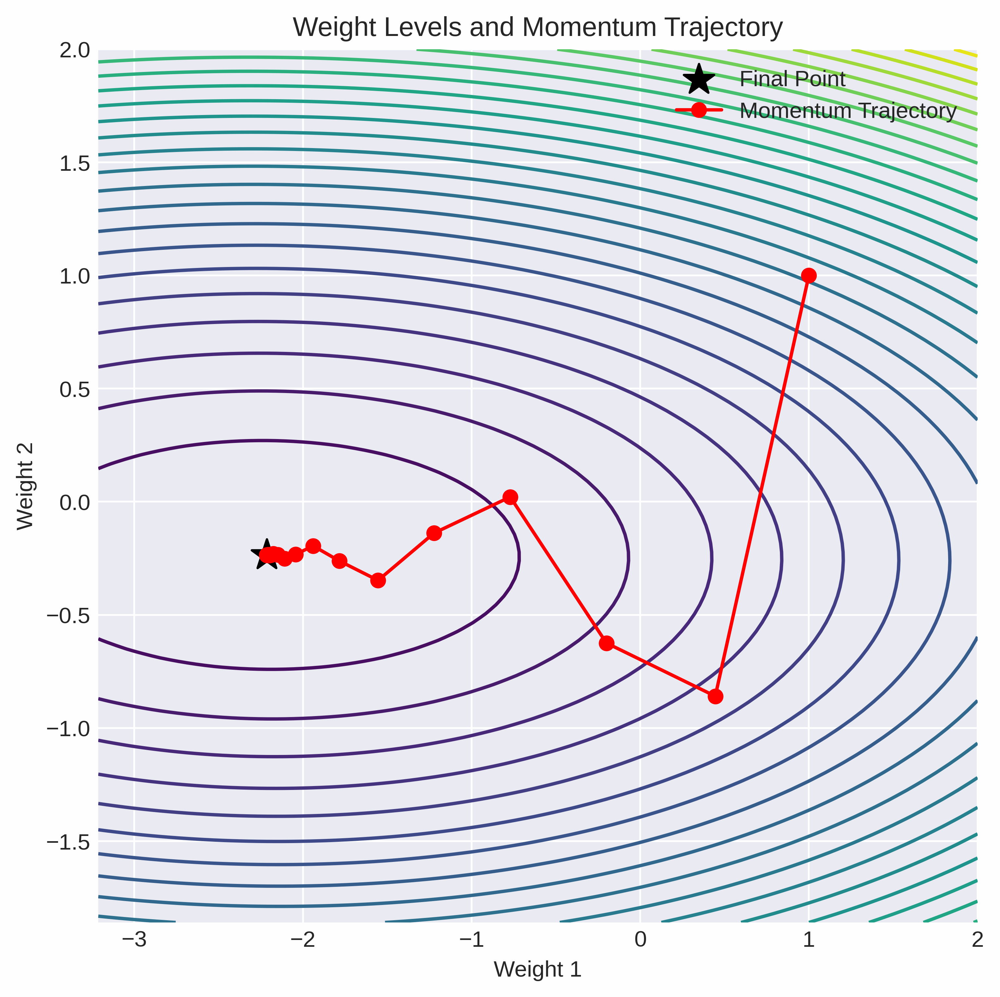

In [11]:
x, x_history, _, nit = momentum_GD(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    beta=0.36,
    gamma=1e-2,
    tol=1e-6,
    maxiter=10000,
)

print(f"iterations: {nit}")
print(f"optimum: {x}")
plot_weight_levels(X, y, x_history, method="Momentum")

### Стохастический градиентный спуск с инерцией

In [12]:
def momentum_SGD(
    X: np.ndarray,
    y: np.ndarray,
    gamma: float,
    batch_size: int = 10,
    x0=None,
    beta=0.9,  # take 10% momentum from previous step
    tol=1e-6,
    maxiter=None,
    maxepoch=None,
    breakcond=True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, int, int]:
    """Function for optimization of weights with SGD plus Momentum method

    Args:
        X (np.ndarray) : Feature matrix.
        y (np.ndarray) : Target vector.
        gamma (float) : Step lenght.
        batch_size (int) : batch size. Default = 10.
        x0 (_type_, optional) : Initial values (guess) for weights. Defaults to None.
        beta : Volume of momentum taken from current step. Default = 0.9.
        tol : Tolerance. Default = 1e-6.
        maxiter : Maximum of iterations.
        maxepoch : Maximum of epochs.
        breakcond (bool) : Condition: if True then method will use difference between weights on k-th and (k-1)-th steps as a criteria for break.

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, int, int] : array of weights, array with history of weights points, array with history of errors, number of iteration, number of epochs
    """
    n, m = X.shape[0], X.shape[1]

    if x0 is None:  # initial anti-gradient
        x0 = np.random.standard_normal(m)
    else:
        x0 = np.array(x0)
        if x0.shape[0] != m:
            raise Exception("Wrong size of x0")

    x_cur = x0.copy()
    x_history = [x_cur.copy()]
    err_history = []

    nit = 0  # number of itereations
    nep = 0  # number of epochs
    h_cur = np.zeros(m) # init momentum

    breaker = True
    while breaker:

        p = np.random.permutation(len(X))  # get random permutation
        batch_generator = generate_batch(
            X[p], y[p], batch_size
        )  # init batch generator
        
        for X_batch, y_batch in batch_generator:  # iterate through batchs

            y_pred = X_batch.dot(x_cur)  # RHS for current weights
            err = y_pred - y_batch  # error
            err_history.append(err.mean())

            grad = 2 * X_batch.T.dot(err) / n  # gradient
            # Break condition ||grad|| < tol
            # if np.linalg.norm(grad) < tol:
            #     breaker = False
            #     break

            # add momentum
            h_cur = gamma * grad + beta * h_cur

            # calculate new optimum
            x_cur -= h_cur
            x_history.append(x_cur.copy())

            nit += 1
            if maxiter is not None:
                if nit >= maxiter:
                    breaker = False
                    break

            # Break condition: 
            # Difference between weights on k-th and (k-1)-th steps
            # is less then tolerance
            if breakcond:
                if np.linalg.norm(x_cur - x_history[-2]) < tol:
                    breaker = False
                    break

        nep += 1
        if maxepoch is not None:
            if nep >= maxepoch:
                breaker = False
                break

    return x_cur, np.array(x_history), np.array(err_history), nit, nep


epochs: 720
iterations: 7197
optimum: [-2.20304263 -0.23534592]


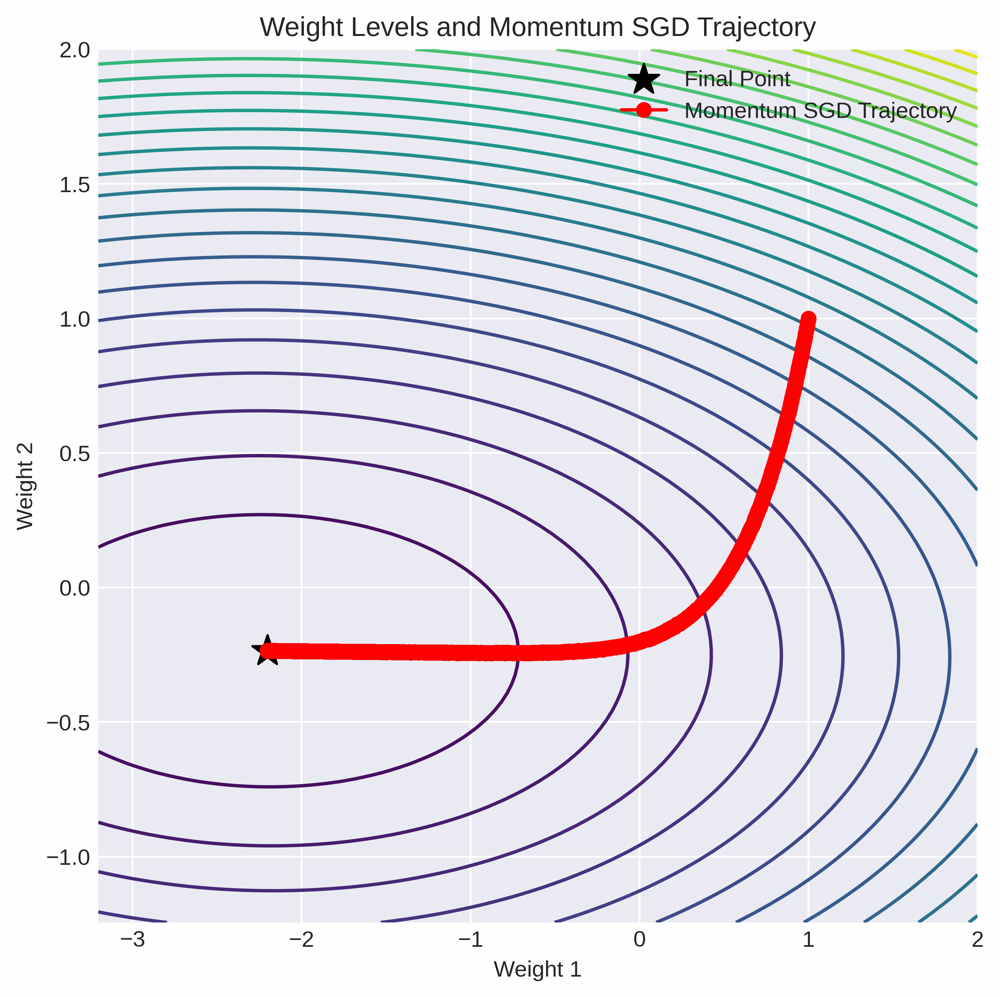

In [13]:
x, x_history, _, nit, nep = momentum_SGD(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    beta=0.36,
    batch_size=50,
    gamma=3e-4,
    tol=1e-6,  
    maxepoch=10000, 
)

print(f"epochs: {nep}")
print(f"iterations: {nit}")
print(f"optimum: {x}")
plot_weight_levels(X, y, x_history, method="Momentum SGD")

### AdaGrad

In [14]:
def AdaGrad(
    X: np.ndarray,
    y: np.ndarray,
    gamma: float,
    batch_size: int = 10,
    x0=None,
    tol=1e-6,
    maxiter=None,
    maxepoch=None,
    breakcond=True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, int, int]:
    """Function for optimization of weights with AdaGrad method

    Args:
        X (np.ndarray) : Feature matrix.
        y (np.ndarray) : Target vector.
        gamma (float) : Step lenght.
        batch_size (int) : batch size. Default = 10.
        x0 (_type_, optional) : Initial values (guess) for weights. Defaults to None.
        tol : Tolerance. Default = 1e-6.
        maxiter : Maximum of iterations.
        maxepoch : Maximum of epochs.
        breakcond (bool) : Condition: if True then method will use difference between weights on k-th and (k-1)-th steps as a criteria for break.

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, int, int] : array of weights, array with history of weights points, array with history of errors, number of iteration, number of epochs
    """
    n, m = X.shape[0], X.shape[1]

    if x0 is None:  # initial anti-gradient
        x0 = np.random.standard_normal(m)
    else:
        x0 = np.array(x0)
        if x0.shape[0] != m:
            raise Exception("Wrong size of x0")

    x_cur = x0.copy()
    x_history = [x_cur.copy()]
    err_history = []

    nit = 0  # number of itereations
    nep = 0  # number of epochs
    G_cur = 0.0
    eps = 1e-8

    breaker = True
    while breaker:

        p = np.random.permutation(len(X))  # get random permutation
        batch_generator = generate_batch(
            X[p], y[p], batch_size
        )  # init batch generator
        
        for X_batch, y_batch in batch_generator:  # iterate through batchs

            y_pred = X_batch.dot(x_cur)  # RHS for current weights
            err = y_pred - y_batch  # error
            err_history.append(err.mean())

            grad = 2 * X_batch.T.dot(err) / n  # gradient
            
            # Break condition ||grad|| < tol
            # if np.linalg.norm(grad) < tol:
            #     breaker = False
            #     break

            # calculate normalizing coefficient
            G_cur += grad.dot(grad)

            # calculate new optimum
            x_cur -= (
                gamma / (np.sqrt(G_cur) + eps)
            ) * grad  # step to anti-gradient's direction
            x_history.append(x_cur.copy())

            nit += 1
            if maxiter is not None:
                if nit >= maxiter:
                    breaker = False
                    break

            # Break condition: 
            # Difference between weights on k-th and (k-1)-th steps
            # is less then tolerance
            if breakcond:
                if np.linalg.norm(x_cur - x_history[-2]) < tol:
                    breaker = False
                    break

        nep += 1
        if maxepoch is not None:
            if nep >= maxepoch:
                breaker = False
                break

    return x_cur, np.array(x_history), np.array(err_history), nit, nep


epochs: 1089
iterations: 10886
optimum: [-2.21335237 -0.23484221]


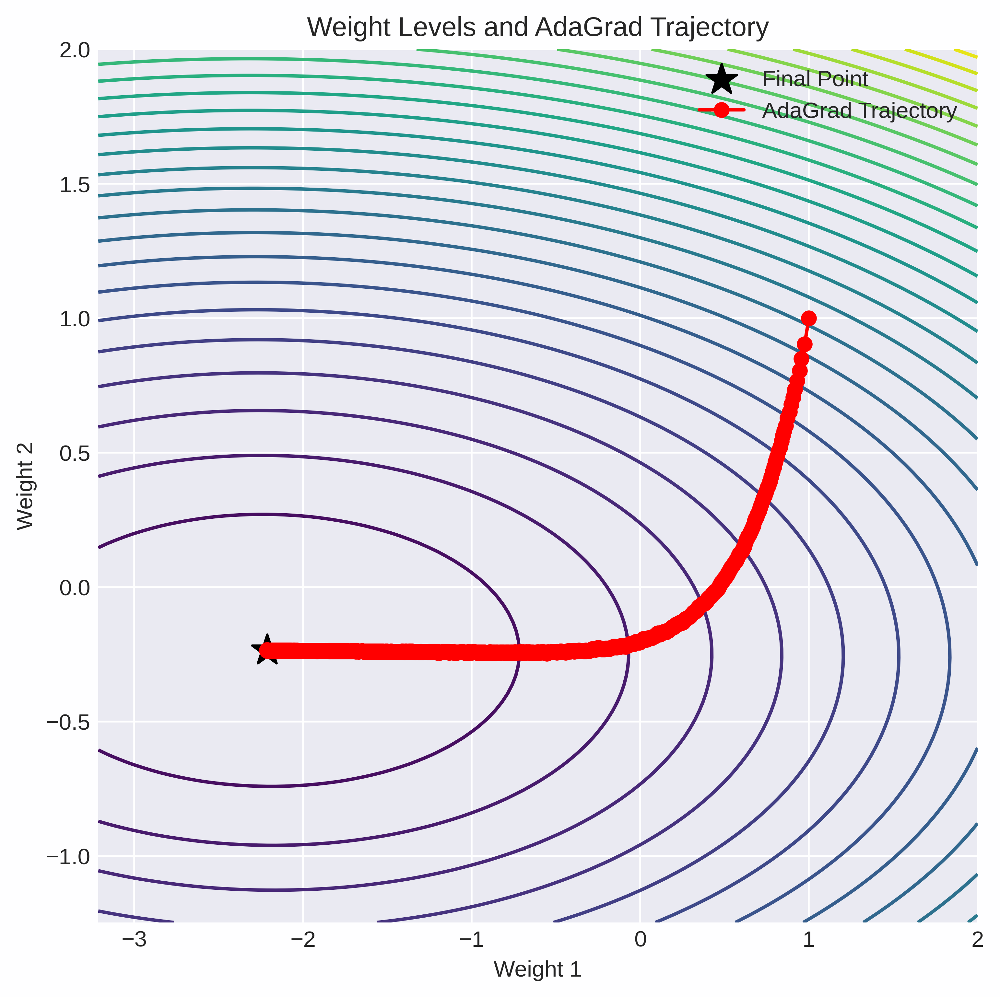

In [15]:
x, x_history, _, nit, nep = AdaGrad(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    batch_size=50,
    gamma=1e-1,
    tol=1e-6,
    maxepoch=10000,  # , maxiter=5000, maxepoch=10
)

print(f"epochs: {nep}")
print(f"iterations: {nit}")
print(f"optimum: {x}")
plot_weight_levels(X, y, x_history, method="AdaGrad")

### RMSprob

In [16]:
def RMSprob(
    X: np.ndarray,
    y: np.ndarray,
    gamma: float,
    batch_size: int = 1,
    x0=None,
    beta=0.99,
    tol=1e-6,
    maxiter=None,
    maxepoch=None,
    breakcond=True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, int, int]:
    """Function for optimization of weights with RMSprob method

    Args:
        X (np.ndarray) : Feature matrix.
        y (np.ndarray) : Target vector.
        gamma (float) : Step lenght.
        batch_size (int) : batch size. Default = 10.
        x0 (_type_, optional) : Initial values (guess) for weights. Defaults to None.
        beta : Volume of gradient norm taken from previous step. Default = 0.99.
        tol : Tolerance. Default = 1e-6.
        maxiter : Maximum of iterations.
        maxepoch : Maximum of epochs.
        breakcond (bool) : Condition: if True then method will use difference between weights on k-th and (k-1)-th steps as a criteria for break.

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, int, int] : array of weights, array with history of weights points, array with history of errors, number of iteration, number of epochs
    """
    n, m = X.shape[0], X.shape[1]

    if x0 is None:  # initial anti-gradient
        x0 = np.random.standard_normal(m)
    else:
        x0 = np.array(x0)
        if x0.shape[0] != m:
            raise Exception("Wrong size of x0")

    if beta is None:  # initial anti-gradient
        beta = 0.99

    x_cur = x0.copy()
    x_history = [x_cur.copy()]
    err_history = []

    nit = 0  # number of itereations
    nep = 0  # number of epochs
    G_cur = 0.0  # grad norms
    eps = 1e-8

    breaker = True
    while breaker:

        p = np.random.permutation(len(X))  # get random permutation
        batch_generator = generate_batch(X[p], y[p], batch_size)  # init batch generator

        for X_batch, y_batch in batch_generator:  # iterate through batchs

            y_pred = X_batch.dot(x_cur)  # RHS for current weights
            err = y_pred - y_batch  # error
            err_history.append(err.mean())

            grad = 2 * X_batch.T.dot(err) / n  # gradient

            # Break condition ||grad|| < tol
            # if np.linalg.norm(grad) < tol:
            #     breaker = False
            #     break

            G_cur = beta * G_cur + (1 - beta) * grad.dot(grad)

            x_cur -= (
                gamma / (np.sqrt(G_cur) + eps)
            ) * grad  # step to anti-gradient's direction
            x_history.append(x_cur.copy())

            nit += 1
            if maxiter is not None:
                if nit >= maxiter:
                    breaker = False
                    break

            # Break condition:
            # Difference between weights on k-th and (k-1)-th steps
            # is less then tolerance
            if breakcond:
                if np.linalg.norm(x_cur - x_history[-2]) < tol:
                    breaker = False
                    break

        nep += 1
        if maxepoch is not None:
            if nep >= maxepoch:
                breaker = False
                break

    return x_cur, np.array(x_history), np.array(err_history), nit, nep

epochs: 4436
iterations: 44353
optimum: [-2.19960761 -0.23519689]


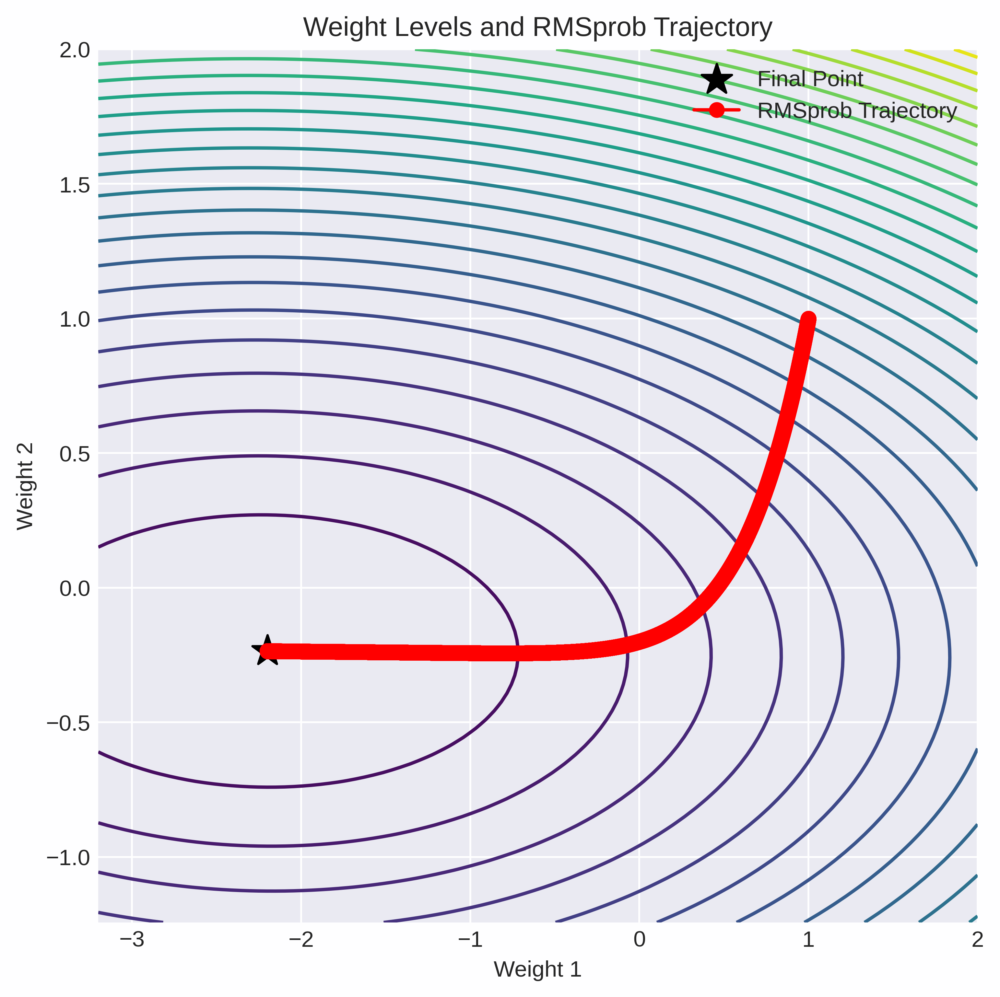

In [17]:
x, x_history, _, nit, nep = RMSprob(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    batch_size=50,
    gamma=1e-4,
    beta=0.99,
    tol=1e-6,
    maxepoch=10000,  # , maxiter=5000, maxepoch=10
)

print(f"epochs: {nep}")
print(f"iterations: {nit}")
print(f"optimum: {x}")
plot_weight_levels(X, y, x_history, method="RMSprob")

### Adam

In [18]:
def Adam(
    X: np.ndarray,
    y: np.ndarray,
    gamma: float,
    batch_size: int = 1,
    x0=None,
    beta_1=0.1,
    beta_2=0.99,
    tol=1e-6,
    maxiter=None,
    maxepoch=None,
    breakcond=True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, int, int]:
    """Function for optimization of weights with Adam method

    Args:
        X (np.ndarray) : Feature matrix.
        y (np.ndarray) : Target vector.
        gamma (float) : Step lenght.
        batch_size (int) : batch size. Default = 10.
        x0 (_type_, optional) : Initial values (guess) for weights. Defaults to None.
        beta_1 : Volume of momentum taken from previous step. Default = 0.1.
        beta_2 : Volume of gradient norm taken from previous step. Default = 0.99.
        tol : Tolerance. Default = 1e-6.
        maxiter : Maximum of iterations.
        maxepoch : Maximum of epochs.
        breakcond (bool) : Condition: if True then method will use difference between weights on k-th and (k-1)-th steps as a criteria for break.

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, int, int] : array of weights, array with history of weights points, array with history of errors, number of iteration, number of epochs
    """
    n, m = X.shape[0], X.shape[1]

    if x0 is None:  # initial anti-gradient
        x0 = np.random.standard_normal(m)
    else:
        x0 = np.array(x0)
        if x0.shape[0] != m:
            raise Exception("Wrong size of x0")

    x_cur = x0.copy()
    x_history = [x_cur.copy()]
    err_history = []

    nit = 0  # number of itereations
    nep = 0  # number of epochs
    h_cur = np.zeros(m)  # init momentum
    G_cur = 0.0  # init gradient norms
    eps = 1e-8

    breaker = True

    while breaker:

        p = np.random.permutation(len(X))  # get random permutation
        batch_generator = generate_batch(X[p], y[p], batch_size)  # init batch generator

        for X_batch, y_batch in batch_generator:  # iterate through batchs

            y_pred = X_batch.dot(x_cur)  # RHS for current weights
            err = y_pred - y_batch  # error
            err_history.append(err.mean())

            grad = 2 * X_batch.T.dot(err) / n  # gradient

            # Break condition ||grad|| < tol
            # if np.linalg.norm(grad) < tol:
            #     breaker = False
            #     break

            h_cur = beta_1 * h_cur + (1 - beta_1) * grad

            G_cur = beta_2 * G_cur + (1 - beta_2) * grad.dot(grad)

            # calculate new optimum
            x_cur -= (
                gamma / (np.sqrt(G_cur) + eps)
            ) * h_cur  # step to anti-gradient's direction
            x_history.append(x_cur.copy())

            # Break condition: difference between weights on k-th and k-1 th step
            # is less then tolerance
            if breakcond:
                if np.linalg.norm(x_cur - x_history[-2]) < tol:
                    breaker = False
                    break

            nit += 1
            if maxiter is not None:
                if nit >= maxiter:
                    breaker = False
                    break

        nep += 1
        if maxepoch is not None:
            if nep >= maxepoch:
                breaker = False
                break

    return x_cur, np.array(x_history), np.array(err_history), nit, nep

epochs: 1673
iterations: 16729
optimum: [-2.21307246 -0.23520981]


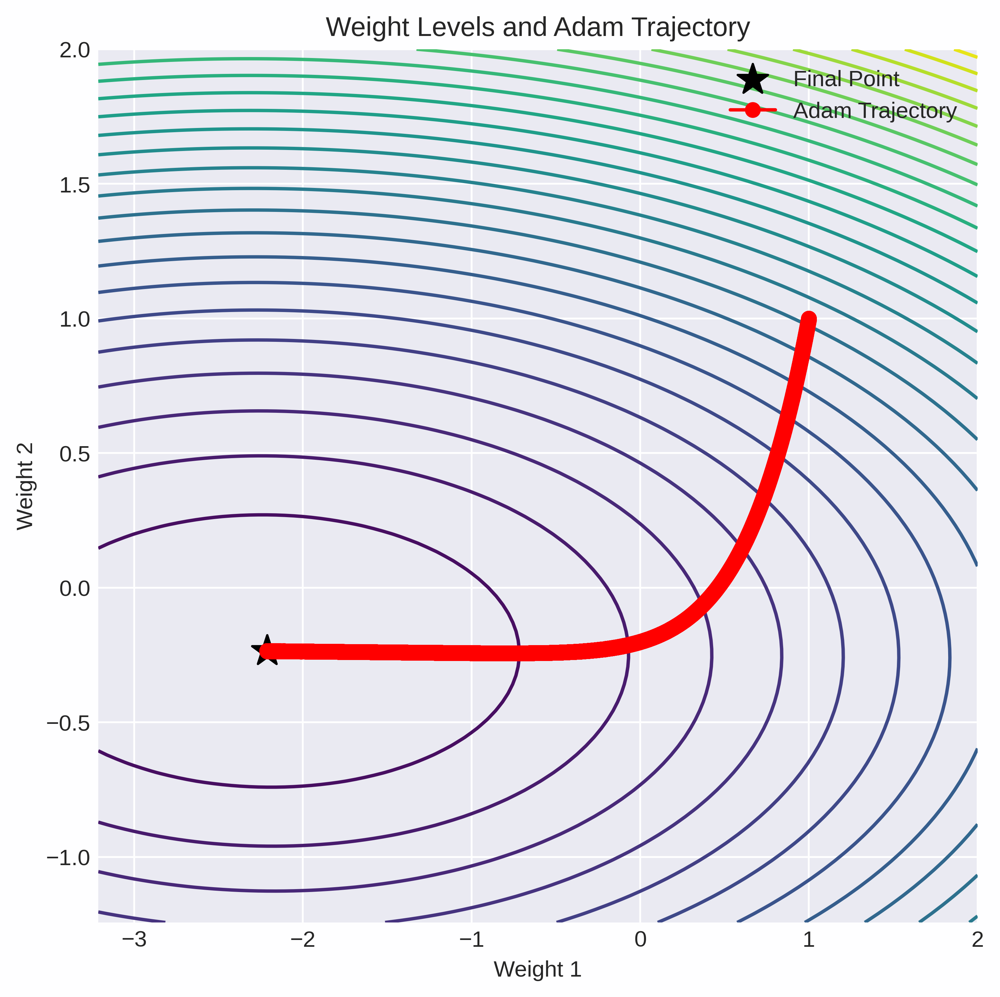

In [19]:
x, x_history, _, nit, nep = Adam(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    batch_size=50,
    gamma=3e-4,
    beta_1=0.9,
    beta_2=0.99,
    tol=1e-6,
    maxepoch=10000,  # , maxiter=5000, maxepoch=10
)

print(f"epochs: {nep}")
print(f"iterations: {nit}")
print(f"optimum: {x}")
plot_weight_levels(X, y, x_history, method="Adam")

## Сравним работу методов 

### Функция отрисовки ошибки на момент $i$-ой итерации

In [20]:
def plot_convergence(err_1, err_2, name_1, name_2, alpha_1=1, alpha_2=1, dpi=300):

    plt.figure(figsize=(10, 6))
    plt.rcParams["figure.dpi"] = dpi

    plt.plot(err_1, label=name_1, color="blue", alpha=alpha_1)

    plt.plot(err_2, label=name_2, color="red", linestyle="--", alpha=alpha_2)

    plt.title("Convergence Comparison")
    plt.xlabel("Iteration")
    plt.ylabel("Error")
    plt.legend()
    plt.grid(True)
    plt.show()



### Функция отрисовки ошибки на момент $i$-ой эпохи

In [21]:
def plot_convergence_epochs(nep_1, nep_2, err_1, err_2, name_1, name_2, alpha_1=1, alpha_2=1, dpi=300):
    
    plt.figure(figsize=(10, 6))
    plt.rcParams["figure.dpi"] = dpi

    plt.plot(err_1[::(nep_1 if nep_1 != 0 else 1)], label=name_1, color="blue", alpha=alpha_1)

    plt.plot(err_2[::(nep_2 if nep_2 != 0 else 1)], label=name_2, color="red", linestyle="--", alpha=alpha_2)

    plt.title("Convergence Comparison")
    plt.xlabel("Epoch")
    plt.ylabel("Error")
    plt.legend()
    plt.grid(True)
    plt.show()

### Функция сравнения двух методов

In [22]:
def function_for_methods_comparison(
    X: np.ndarray,
    y: np.ndarray,
    gamma_1: float,
    gamma_2: float,
    name_method_1: str = "GD",
    name_method_2: str = "SGD",
    batch_size: int = 50,
    x0=None,
    tol=1e-6,
    maxiter=None,
    maxepoch=None,
    alpha_1=1.,
    alpha_2=1.,
    plot_by_epochs=False,
    breakcond=True,
):
    if maxepoch is None:
        maxepoch = maxiter // 10

    def res_method(
        X: np.ndarray,
        y: np.ndarray,
        gamma: float,
        name_method: str = "GD",
        batch_size: int = 50,
        x0=None,
        tol=1e-6,
        maxiter=None,
        maxepoch=None,
        breakcond=True,
    ):
        
        match name_method:
            case "GD":
                return GD(
                    X=X,
                    y=y,
                    gamma=gamma,
                    x0=x0,
                    tol=tol,
                    maxiter=maxiter,
                    breakcond=breakcond,
                )
            case "SGD":
                return SGD(
                    X=X,
                    y=y,
                    gamma=gamma,
                    batch_size=batch_size,
                    x0=x0,
                    tol=tol,
                    maxepoch=maxepoch,
                    breakcond=breakcond,
                )
            case "momentum_GD":
                return momentum_GD(
                    X=X,
                    y=y,
                    gamma=gamma,
                    x0=x0,
                    tol=tol,
                    maxiter=maxiter,
                    breakcond=breakcond,
                )
            case "momentum_SGD":
                return momentum_SGD(
                    X=X,
                    y=y,
                    gamma=gamma,
                    batch_size=batch_size,
                    x0=x0,
                    tol=tol,
                    maxepoch=maxepoch,
                    breakcond=breakcond,
                )
            case "AdaGrad":
                return AdaGrad(
                    X=X,
                    y=y,
                    gamma=gamma,
                    batch_size=batch_size,
                    x0=x0,
                    tol=tol,
                    maxepoch=maxepoch,
                    breakcond=breakcond,
                )
            case "RMSprob":
                return RMSprob(
                    X=X,
                    y=y,
                    gamma=gamma,
                    batch_size=batch_size,
                    x0=x0,
                    tol=tol,
                    maxepoch=maxepoch,
                    breakcond=breakcond,
                )
            case "Adam":
                return Adam(
                    X=X,
                    y=y,
                    gamma=gamma,
                    batch_size=batch_size,
                    x0=x0,
                    tol=tol,
                    maxepoch=maxepoch,
                    breakcond=breakcond,
                )

    res_method_1 = res_method(
        X=X,
        y=y,
        gamma=gamma_1,
        name_method=name_method_1,
        batch_size=batch_size,
        x0=x0,
        tol=tol,
        maxiter=maxiter,
        maxepoch=maxepoch,
        breakcond=breakcond,
    )
    res_method_2 = res_method(
        X=X,
        y=y,
        gamma=gamma_2,
        name_method=name_method_2,
        batch_size=batch_size,
        x0=x0,
        tol=tol,
        maxiter=maxiter,
        maxepoch=maxepoch,
        breakcond=breakcond,
    )

    if not plot_by_epochs:
        plot_convergence(
            abs(res_method_1[2]),
            abs(res_method_2[2]),
            name_1=name_method_1,
            name_2=name_method_2,
            dpi=500,
            alpha_1=alpha_1,
            alpha_2=alpha_2,
        )
    else: 
        plot_convergence_epochs(
            len(res_method_1[2]) // maxepoch,
            len(res_method_2[2]) // maxepoch,
            abs(res_method_1[2]),
            abs(res_method_2[2]),
            name_1=name_method_1,
            name_2=name_method_2,
            dpi=500,
            alpha_1=alpha_1,
            alpha_2=alpha_2,
        )
    pass

### Прогонка тестов

Сравним на тех же двумерных данных


shape=(500, 2)

Тест из baseline (сравнение GD и SGD): 

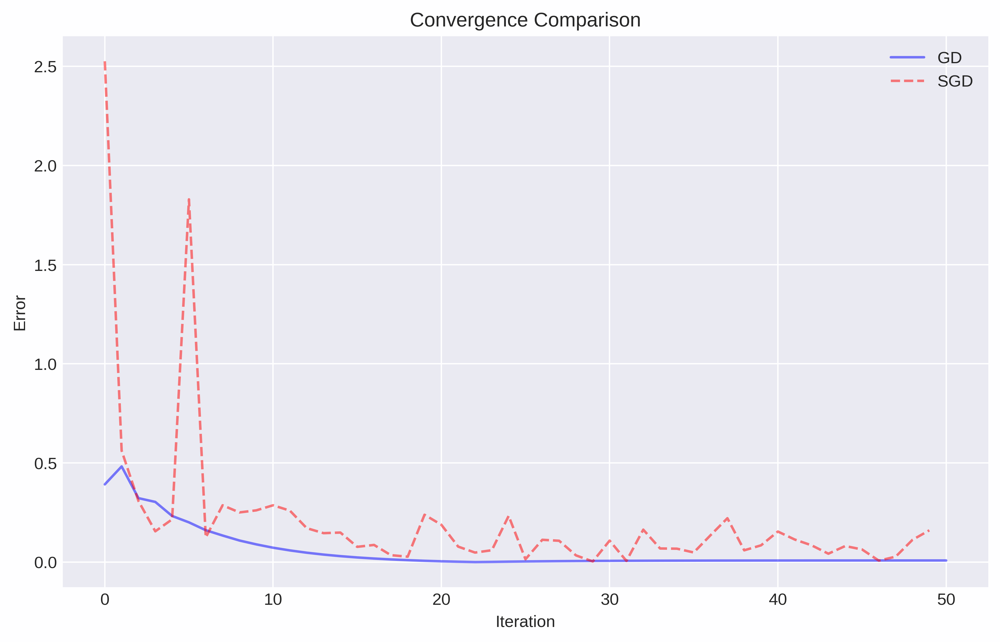

In [23]:
# Test params
w0 = [1.0, 1.0]
gamma = 1e-2
batch_size = 50
maxiter = 50

function_for_methods_comparison(
    X=X, 
    y=y,
    gamma_1=gamma,
    gamma_2=1e-1,
    name_method_1="GD",
    name_method_2="SGD",
    batch_size=batch_size,
    x0=w0,
    maxiter=maxiter,
    alpha_1=0.5,
    alpha_2=0.5    
)

Как видно, GD буквально за несколько итераций оказывается вблизи оптимума, в то время как поведение SGD может быть весьма нестабильным.

Теперь сравним GD и SGD с добавлением инерции.

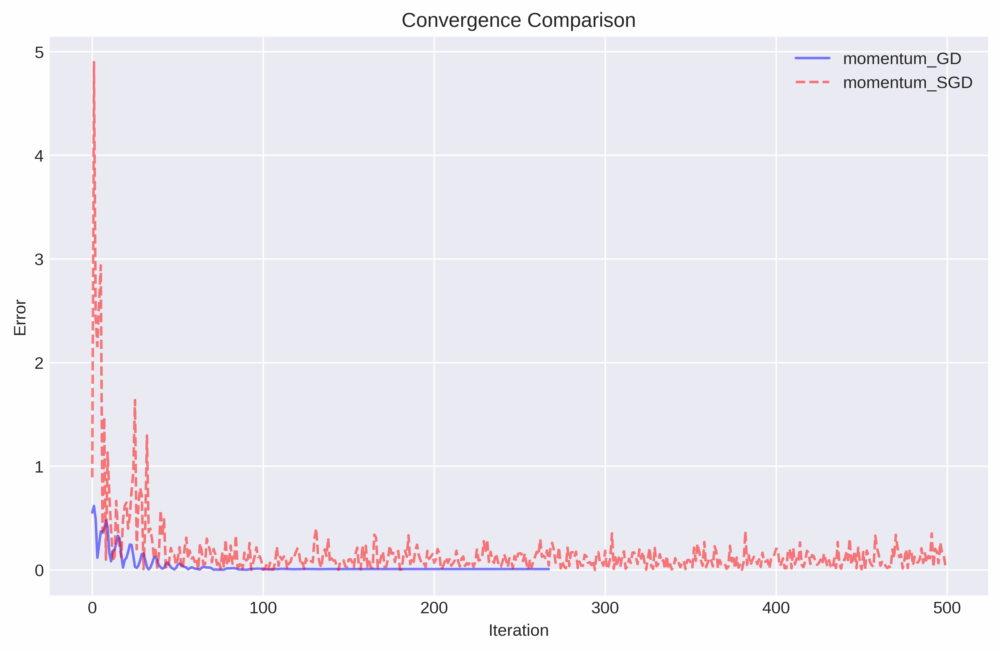

In [24]:
# Test params
w0 = [2.0, 1.0]
gamma = 1e-2
batch_size = 50
maxiter = 500

function_for_methods_comparison(
    X=X, 
    y=y,
    gamma_1=gamma,
    gamma_2=gamma,
    name_method_1="momentum_GD",
    name_method_2="momentum_SGD",
    batch_size=batch_size,
    x0=w0,
    maxiter=maxiter,
    alpha_1=0.5,
    alpha_2=0.5,
)

Для данных методов наблюдаем аналогичное поведение.

> Далее будем сравнивать методы, в которых присутствуют эпохи (внешние итерации алгоритма).
> Для них будет некорректно сравнивать их поитерационно (в момент $i$-ой внутренней), т.к. алгоритмы имеют различное внутреннее устройство

### SGD+Momentum vs RMSprob

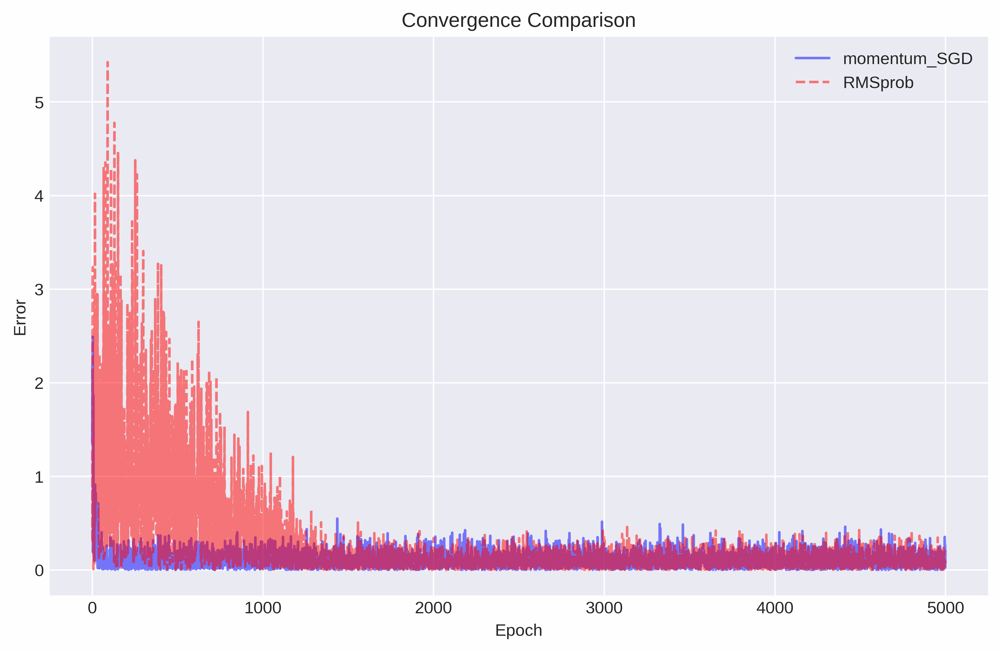

In [25]:
# Test params
w0 = [1.0, 1.0]
gamma = 3e-4
batch_size = 50
maxepoch = 5000


function_for_methods_comparison(
    X=X, 
    y=y,
    gamma_1=gamma,
    gamma_2=gamma,
    name_method_1="momentum_SGD",
    name_method_2="RMSprob",
    batch_size=batch_size,
    x0=w0,
    maxepoch=maxepoch,
    alpha_1=0.5,
    alpha_2=0.5,
    plot_by_epochs=True,
    breakcond=False,
)

Как видно, что до ~250-й эпохи ошибка SGD+Momentum убывает быстрее, чем ошибка RMSprob, далее оба метода отрабатывают примерно одинаково. 

### SGD+Momentum vs Adam

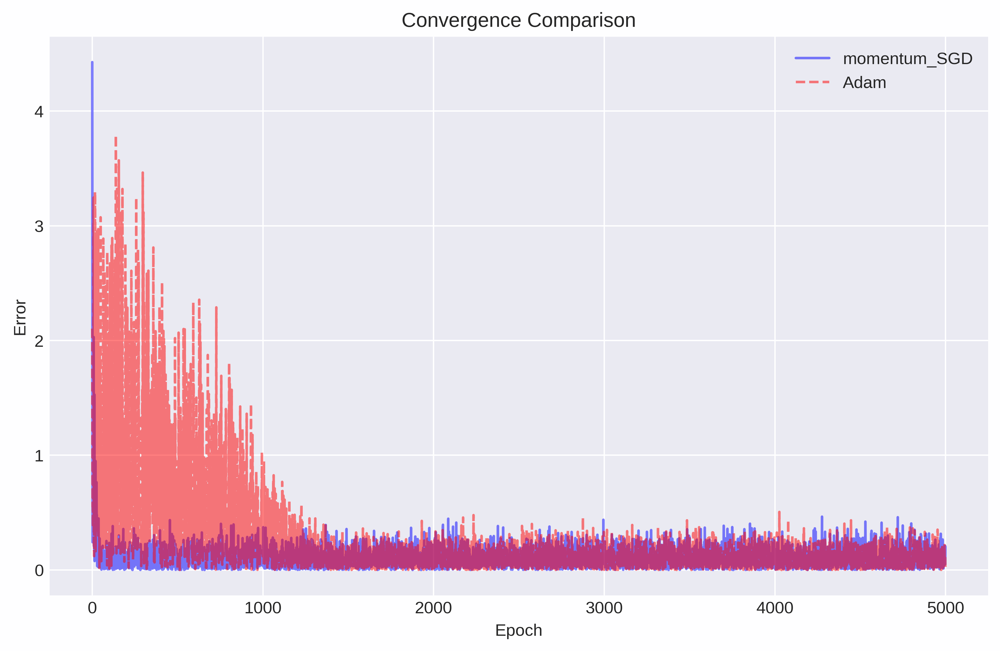

In [26]:
# Test params
w0 = [1.0, 1.0]
gamma = 3e-4
batch_size = 50
maxepoch = 5000

function_for_methods_comparison(
    X=X, 
    y=y,
    gamma_1=gamma,
    gamma_2=gamma,
    name_method_1="momentum_SGD",
    name_method_2="Adam",
    batch_size=batch_size,
    x0=w0,
    maxepoch=maxepoch,
    alpha_1=0.5,
    alpha_2=0.5,
    plot_by_epochs=True,
    breakcond=False,
)

Аналогичные результаты будут получены и при сравнении Adam и SGD+Momentum

### RMSprob vs Adam

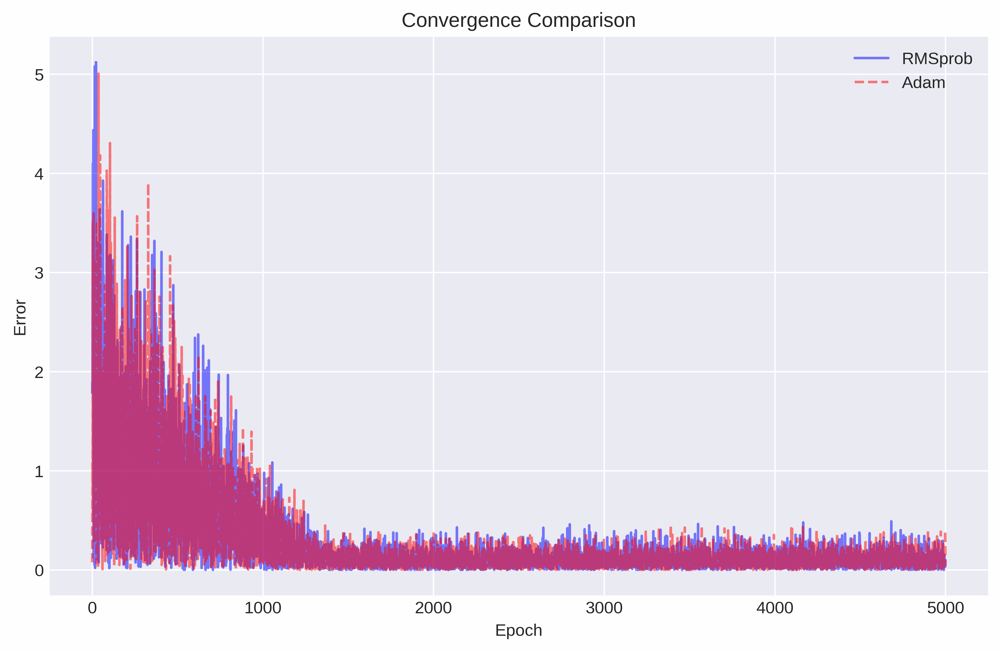

In [27]:
# Test params
w0 = [1.0, 1.0]
gamma = 3e-4
batch_size = 50
maxepoch = 5000

function_for_methods_comparison(
    X=X, 
    y=y,
    gamma_1=gamma,
    gamma_2=gamma,
    name_method_1="RMSprob",
    name_method_2="Adam",
    batch_size=batch_size,
    x0=w0,
    maxepoch=maxepoch,
    alpha_1=0.5,
    alpha_2=0.5,
    plot_by_epochs=True,
    breakcond=False,
)

На двумерных данных результат, можно сказать, идентичный.

### Увеличим размерность задачи

In [28]:
n, m = 5000, 20

w_true = np.random.standard_normal(m)

X1 = np.random.uniform(-5, 5, (n, m))
X1 *= (np.arange(m) * 2 + 1)[np.newaxis, :]

y1 = X1.dot(w_true) + np.random.normal(0, 1, (n))

### SGD+Momentum vs RMSprob

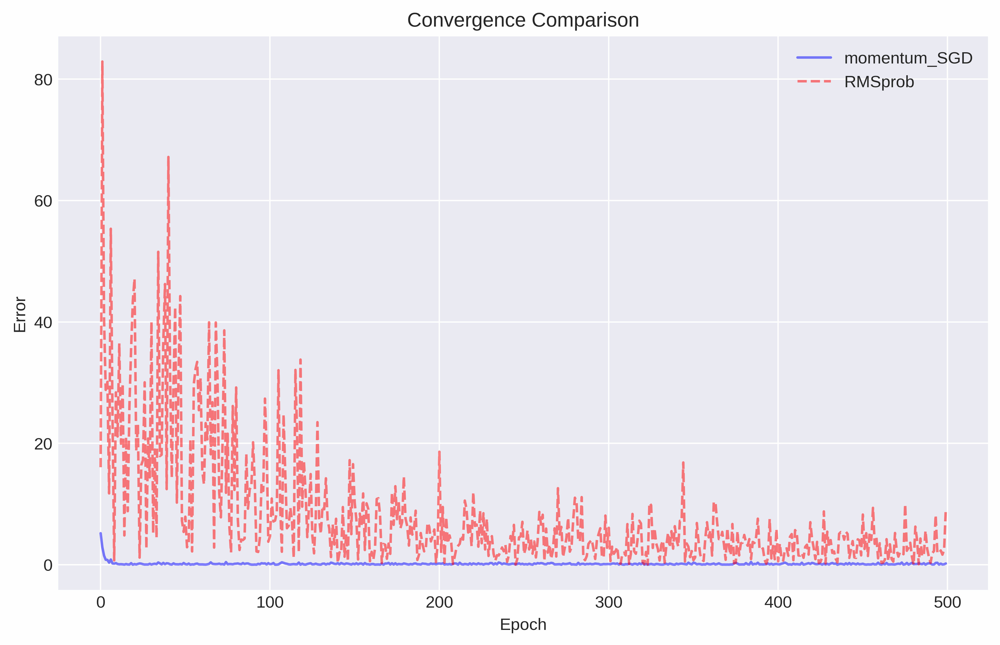

In [29]:
# Test params
gamma = 1e-4

w0 = np.zeros(m)
w0[1] = 5.0
# w0 = None

batch_size = 50
maxiter = 5000

function_for_methods_comparison(
    X=X1, 
    y=y1,
    gamma_1=3e-4,
    gamma_2=3e-4,
    name_method_1="momentum_SGD",
    name_method_2="RMSprob",
    batch_size=batch_size,
    x0=w0,
    tol=1e-6,
    maxiter=maxiter,
    alpha_1=0.5,
    alpha_2=0.5,
    plot_by_epochs=True,
)

### SGD+Momentum vs Adam

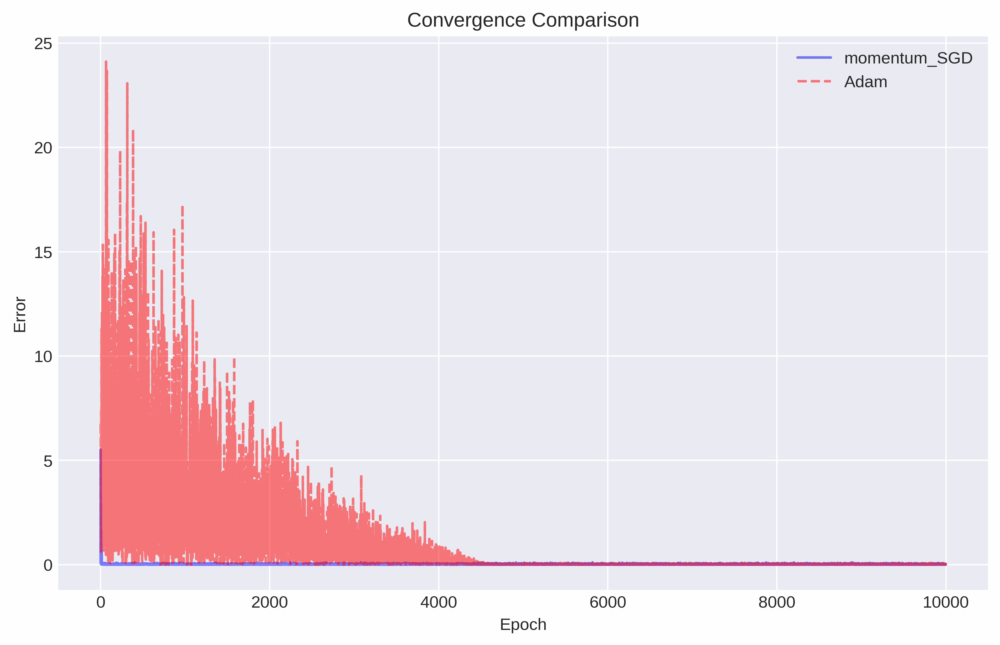

In [30]:
# Test params
gamma = 3e-4

w0 = np.zeros(m)
w0[3] = 2.0
# w0 = None

batch_size = 1000
maxepoch = 10000

function_for_methods_comparison(
    X=X1, 
    y=y1,
    gamma_1=gamma,
    gamma_2=gamma,
    name_method_1="momentum_SGD",
    name_method_2="Adam",
    batch_size=batch_size,
    x0=w0,
    tol=1e-6,
    maxepoch=maxepoch,
    alpha_1=0.5,
    alpha_2=0.5,
    plot_by_epochs=True,
)

### RMSprob vs Adam

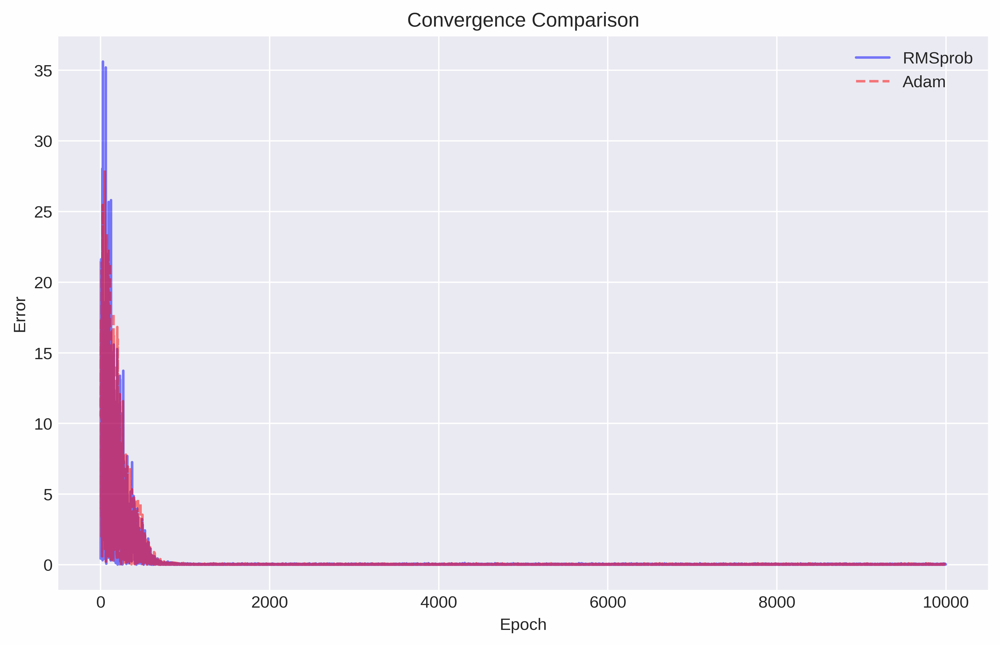

In [31]:
# Test params
gamma = 3e-3

w0 = np.ones(m)
w0[3] = 2.0

# w0=None
batch_size = 1000
maxepoch = 10000

function_for_methods_comparison(
    X=X1, 
    y=y1,
    gamma_1=gamma,
    gamma_2=gamma,
    name_method_1="RMSprob",
    name_method_2="Adam",
    batch_size=batch_size,
    x0=w0,
    tol=1e-6,
    maxepoch=maxepoch,
    alpha_1=0.5,
    alpha_2=0.5,
    plot_by_epochs=True,
)

### Выводы по блоку сравнений методов на многомерных данных

Полученные результаты аналогичны двумерному случаю.

## Эксперименты с методами

Для двумерных задач оптимальные параметры были подобраны и приведены выше.
Все методы получают ответ с точностью $tol = 10^{-6}$.

Самым интересным, по моему мнению, оказался метод инерции для классического градиентного спуска(momentum_GD). При различных значениях параметра $\beta$, отвечающего за количество момента берущегося с предыдущего шага, получаются различные траектории движения.


iterations: 230
optimum: [-2.21348735 -0.23515841]
beta: 0.9


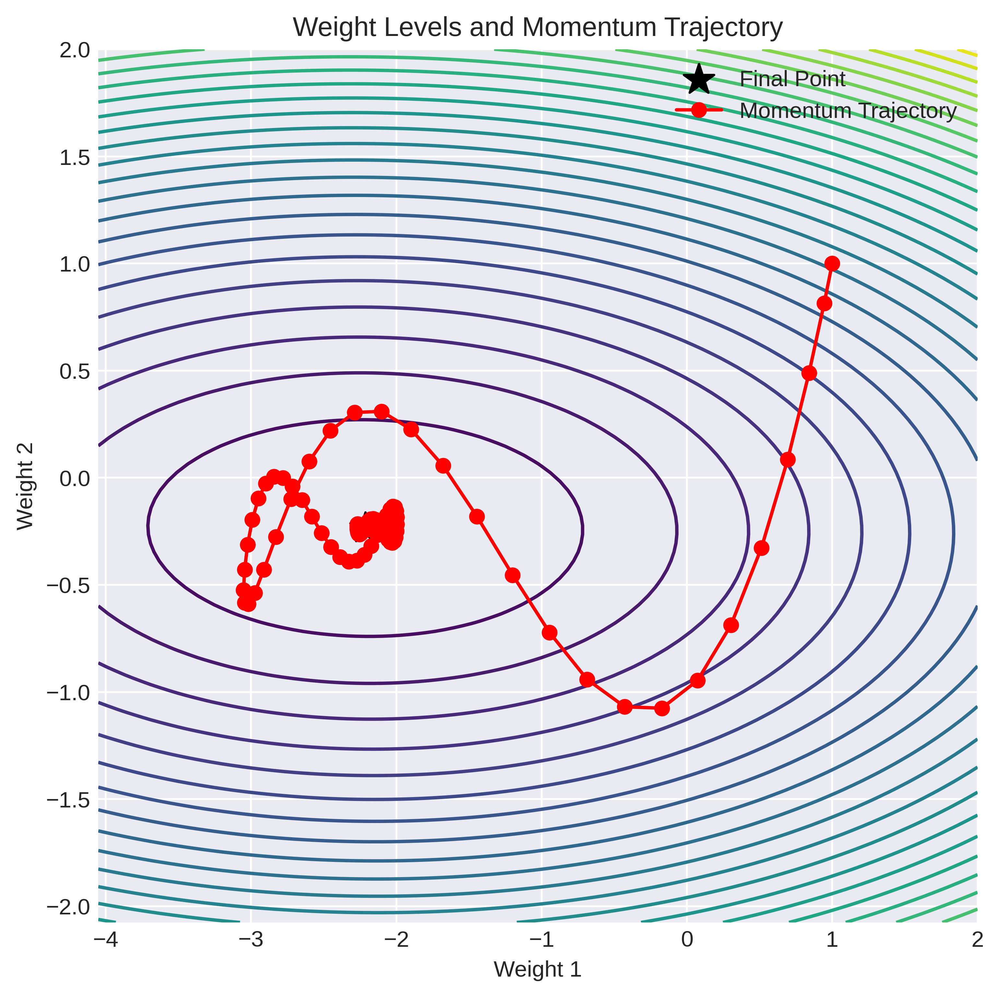

iterations: 327
optimum: [-2.21344246 -0.23515212]
beta: 0.5


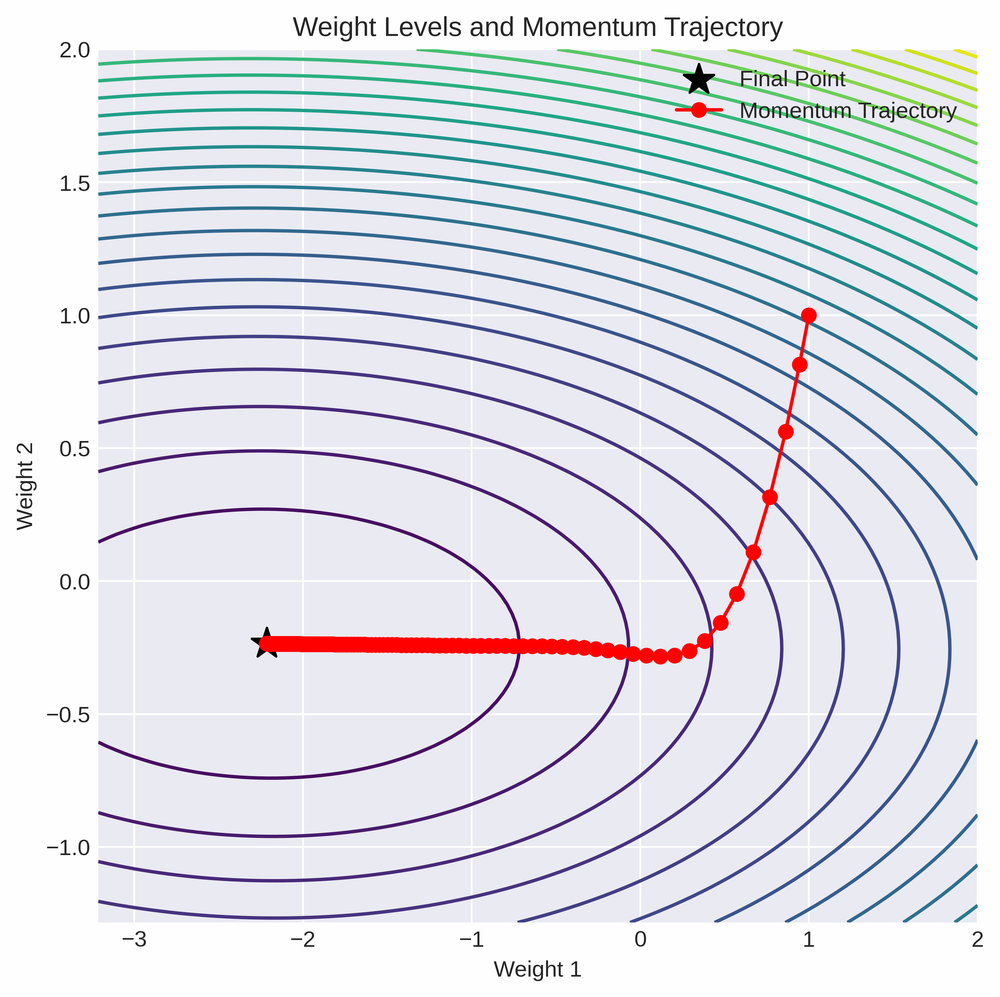

iterations: 579
optimum: [-2.21341785 -0.23515227]
beta: 0.1


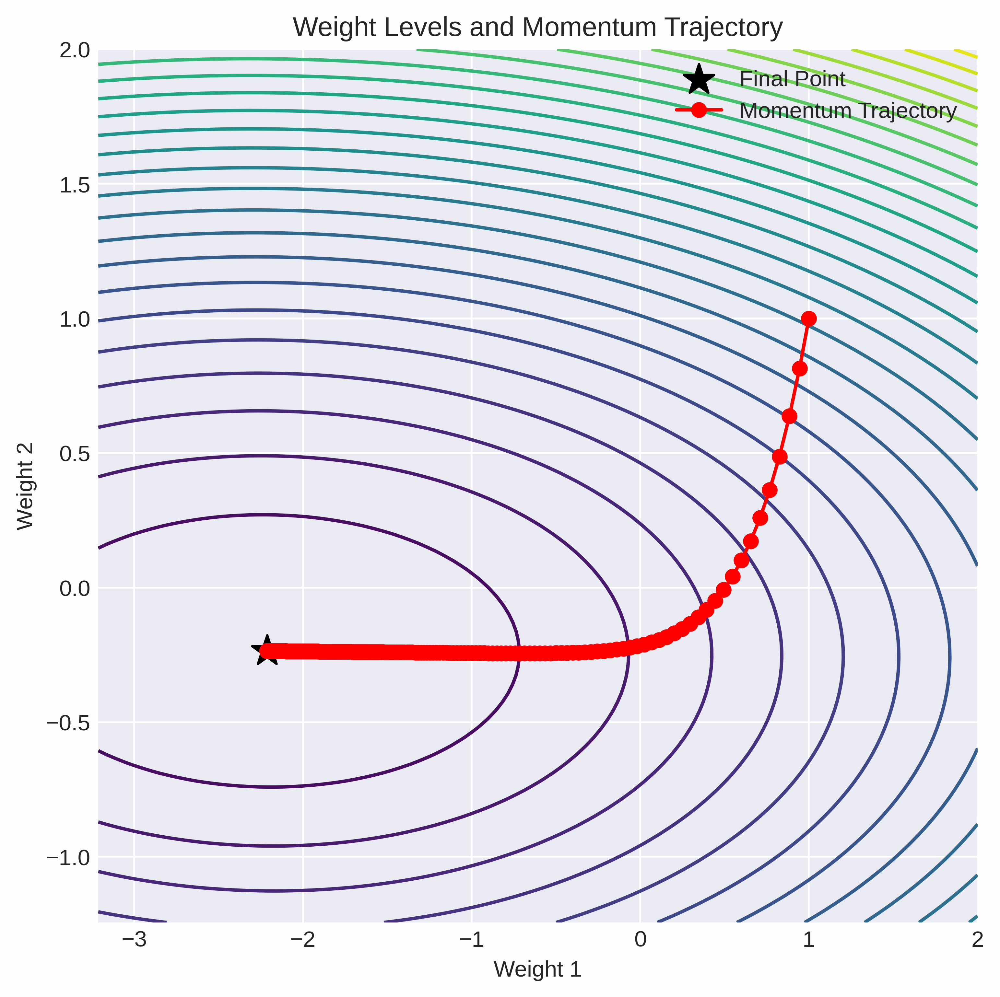

In [32]:
gamma = 1e-3


beta = 0.9
x, x_history, _, nit = momentum_GD(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    beta=beta,
    gamma=gamma,
    tol=1e-6,
    maxiter=10000,
)

print(f"iterations: {nit}")
print(f"optimum: {x}")
print(f"beta: {beta}")
plot_weight_levels(X, y, x_history, method="Momentum")

beta = 0.5
x, x_history, _, nit = momentum_GD(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    beta=beta,
    gamma=gamma,
    tol=1e-6,
    maxiter=10000,
)
print(f"iterations: {nit}")
print(f"optimum: {x}")
print(f"beta: {beta}")
plot_weight_levels(X, y, x_history, method="Momentum")

beta = 0.1
x, x_history, _, nit = momentum_GD(
    X=X,
    y=y,
    x0=[1.0, 1.0],
    beta=beta,
    gamma=gamma,
    tol=1e-6,
    maxiter=10000,
)
print(f"iterations: {nit}")
print(f"optimum: {x}")
print(f"beta: {beta}")
plot_weight_levels(X, y, x_history, method="Momentum")

### Взглянем на результаты методов на многомерных данных: 

In [34]:
res = momentum_SGD(
    X=X1,
    y=y1,
    batch_size=100,
    gamma=3e-4,
    tol=1e-4,
    maxepoch=1000,
    breakcond=False,
)

print("----------------:")
print(f"""momentum_SGD:
    w: {res[0]} \n
    || w_cur - w_prev ||: {np.linalg.norm(np.array(res[1][-1]) - np.array(res[1][-2]))} \n
    error: {abs(res[2][-1])} \n
""")
# print(res[0], res[3], res[4])
# print(np.linalg.norm(np.array(res[1][-1]) - np.array(res[1][-2])))

res = RMSprob(
    X=X1,
    y=y1,
    batch_size=100,
    gamma=3e-4,
    tol=1e-4,
    maxepoch=1000,
    breakcond=False,
)

print("----------------:")
print(f"""RMSprob:
    w: {res[0]} \n
    || w_cur - w_prev ||: {np.linalg.norm(np.array(res[1][-1]) - np.array(res[1][-2]))} \n
    error: {abs(res[2][-1])} \n
""")
# print(res[0], res[3], res[4])
# print(np.linalg.norm(np.array(res[1][-1]) - np.array(res[1][-2])))

res = Adam(
    X=X1,
    y=y1,
    batch_size=100,
    gamma=3e-4,
    tol=1e-4,
    maxepoch=1000,
    breakcond=False,
)

print("----------------")
print(f"""Adam:
    w: {res[0]} \n
    || w_cur - w_prev ||: {np.linalg.norm(np.array(res[1][-1]) - np.array(res[1][-2]))} \n
    error: {abs(res[2][-1])} \n
""")
# print(res[0], res[3], res[4])
# print(np.linalg.norm(np.array(res[1][-1]) - np.array(res[1][-2])))


----------------:
momentum_SGD:
    w: [-0.10475459  0.12749393  1.38955374 -0.32126191  0.4277667  -1.04561437
 -1.97077153  0.71965664 -1.43377334  0.16779762 -0.37325918  2.17306493
 -0.21357264  0.7442892  -0.32194964 -1.12478247  0.60020681 -0.92605711
 -0.68184374  0.37254664] 

    || w_cur - w_prev ||: 0.0009596187845865423 

    error: 0.07606399733304055 


----------------:
RMSprob:
    w: [-0.38872535  0.12881724  1.39019382 -0.32047549  0.42661214 -1.04452923
 -1.97013279  0.71963846 -1.43371998  0.16620591 -0.37186441  2.17183431
 -0.21225867  0.74337273 -0.32159099 -1.12575244  0.59878416 -0.92494006
 -0.68142737  0.37217214] 

    || w_cur - w_prev ||: 0.00041027444232075036 

    error: 0.041641837414654735 


----------------
Adam:
    w: [-0.24895524  0.14169527  1.38961244 -0.32093234  0.42667308 -1.04477807
 -1.97047624  0.71945374 -1.43365956  0.16645097 -0.37197737  2.17203002
 -0.21197069  0.74343118 -0.3214451  -1.12567534  0.59853351 -0.92479702
 -0.68140298  

Из полученных результатов видно:
- Все методы сошлись плюс-минус к одной точке
- Для метода Adam норма ветора разности весов на двух последних итерациях наименьшая. 

## Общие выводы

- В методах оптимизации все зависит от выбора параметров модели. При одних парметрах хорошо работает первый метода, при других &mdash; второй. Методы хорошо сравнивать, при одинаковых начальных размерах шага, но такое сравнение слегка нечестное, т.к. разным методам нужны разные шаги для получения оптимальной сходимости, а также из-за случайности внесенной перестановками (выборами батчей) внутри стохастических алгоритмов: в разные моменты времени эти алгоритмы идут вдоль разных направлений, как следствие, оказываются в разных точках пространства ошибок и с разными значениями отклонений. 

- На тех данных, которые имеются, лучше себя показывают не стохастические алгортмы. Будь то реальные данные со множеством локальных минимумов методы RMSprop и Adam были бы значительно выгоднее остальных.

- На дискретных данных, как и на гладгих функциях, многое зависит от выбора начальной точки и начального значения шага.

- Тяжело точно сказать, что будет лучше для конкретной задачи. Единственное, что заставляет склонятся в сторону одного метода или другого &mdash; природа начальных данных. Но если такой информации не будет, то предпочтение стоит отдать стохастическим алгоритмам, которые могут менять шаг и в которых заложены принципы, позволяющие не застревать в локальных минимумах.